
#### 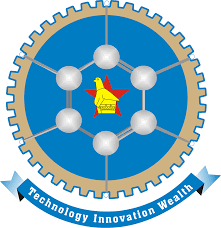

# Convolution Neural Network Image Classifier Challenge




# Introduction.

Convolutional neural networks (CNN) are a special architecture of artificial neural networks which use some features of the visual cortex .It was proposed by Yann LeCun in 1988. One of the most popular uses of a Convolution Neural Network is image classification.Convolutional neural networks are comprised of two very simple elements, namely convolutional layers and pooling layers.Image recognition and classification is a rapidly growing field in the area of machine learning.The purpose of building an image classifier in this instance is to correctly identify each group member based on the images.

# Loading the dataset

Each group member provided 500 images and our dataset had a total of 1000 images which were labeled into 2 classes.The dataset comprised of a training set of 80% and a test set of 20%.The test data images will be used to  finally evaluate the accuracy of the model based on images it has never seen. This helps with over-fitting which is when after training a neural network it starts working very well on the training data(and very similar images) but fails to work well for other images. The iamge size was 64x64x3 and the 3 represents that the image is an RGB image (Red, Green , Blue). A single fully-connected neuron in a first hidden layer of a regular Neural Network would have 64x64x3 weights.The role of the ConvNet is to reduce the images into a form which is easier to process, without losing features which are critical for getting a good prediction






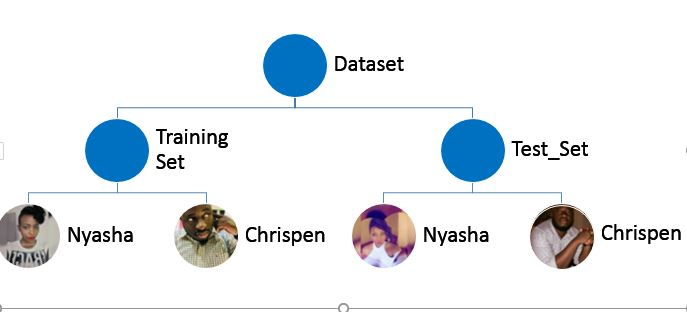

# Loading the images

In [1]:
from PIL import Image
%matplotlib inline  


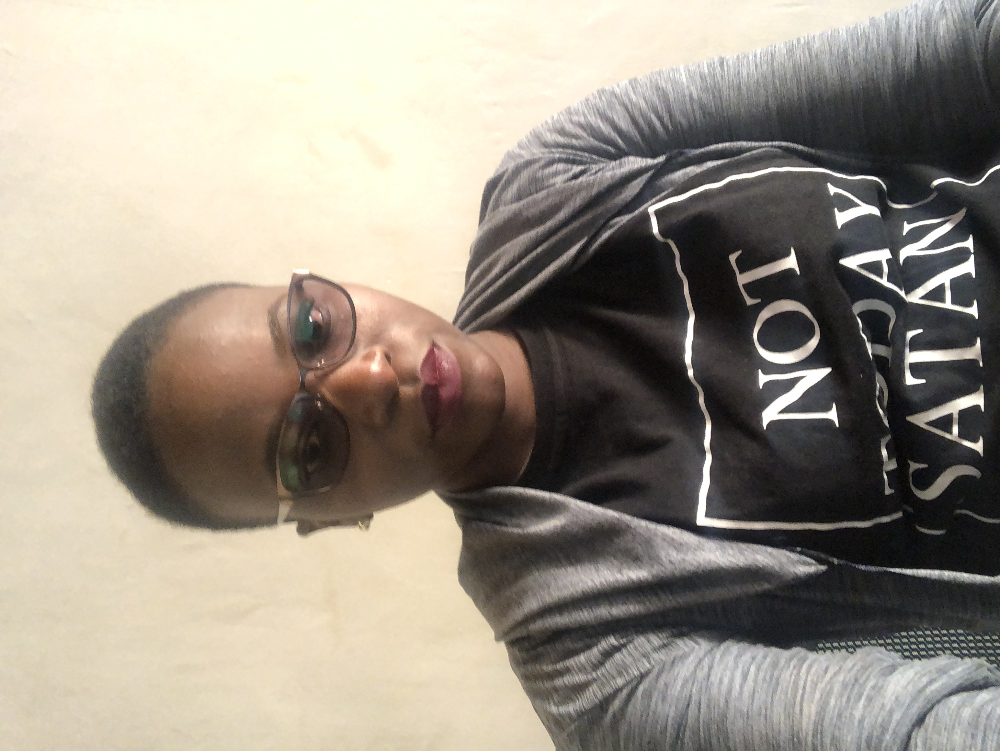

In [3]:
# importing the images of each group member

Nyasha = Image.open("Images\\Test_Set\\Nyasha\\IMG_3001.JPG")

Nyasha

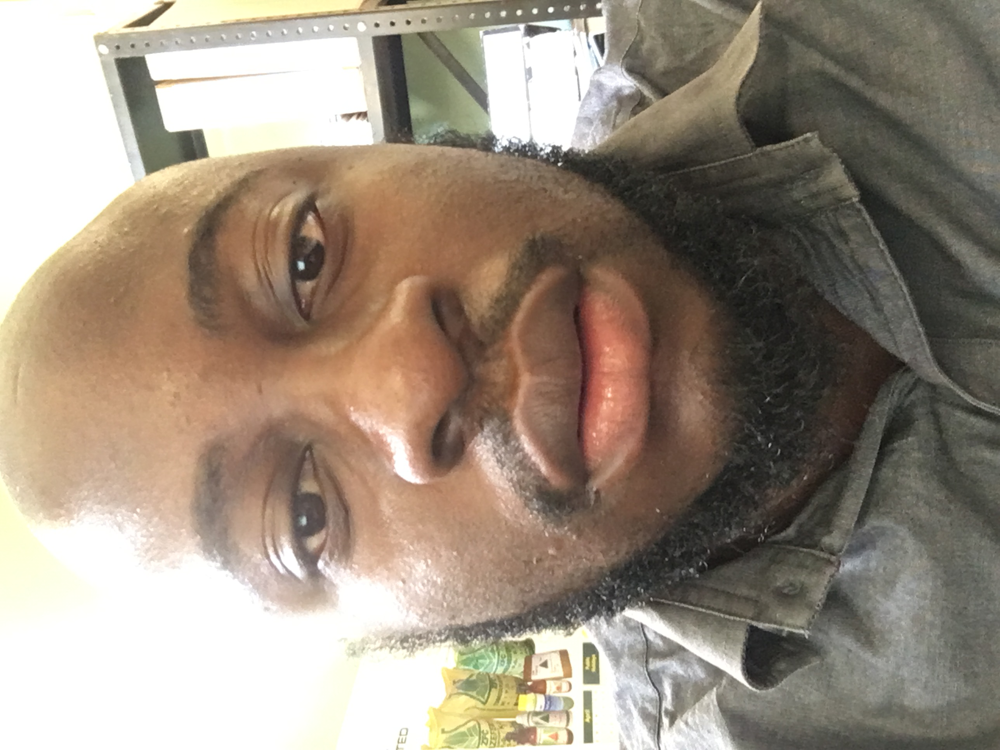

In [4]:
Chrispen = Image.open("Images\\Test_Set\\Chrispen\\IMG_4797.JPG")

Chrispen

# Explanatory Data Analysis

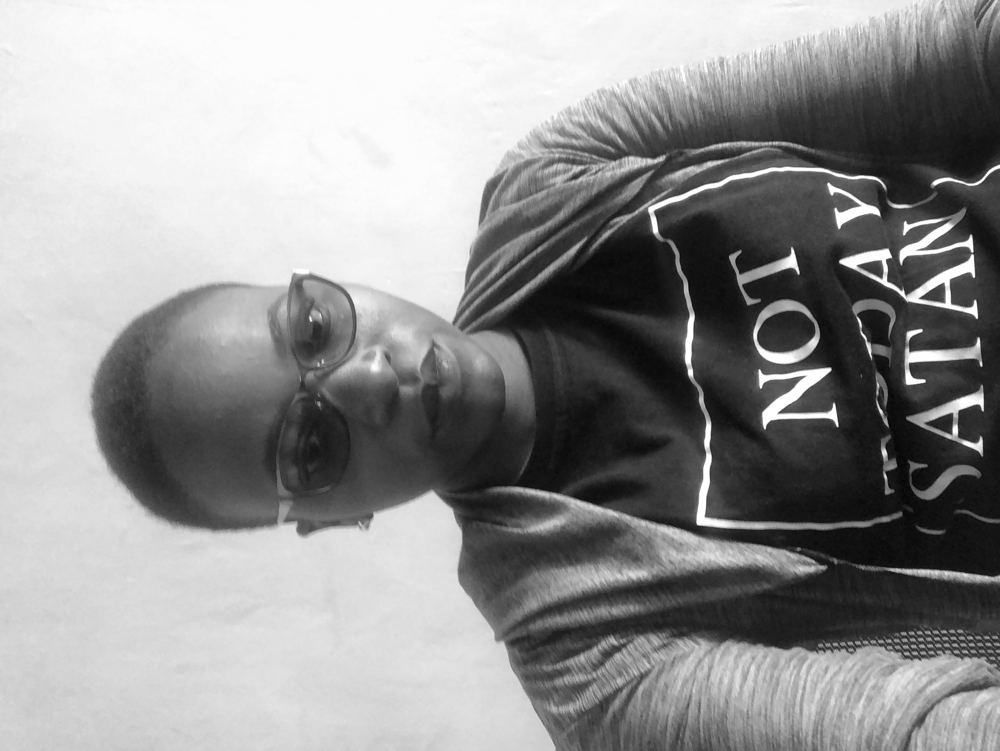

In [5]:
# Gray-scaling the images

Image = Nyasha.convert('L')

Image

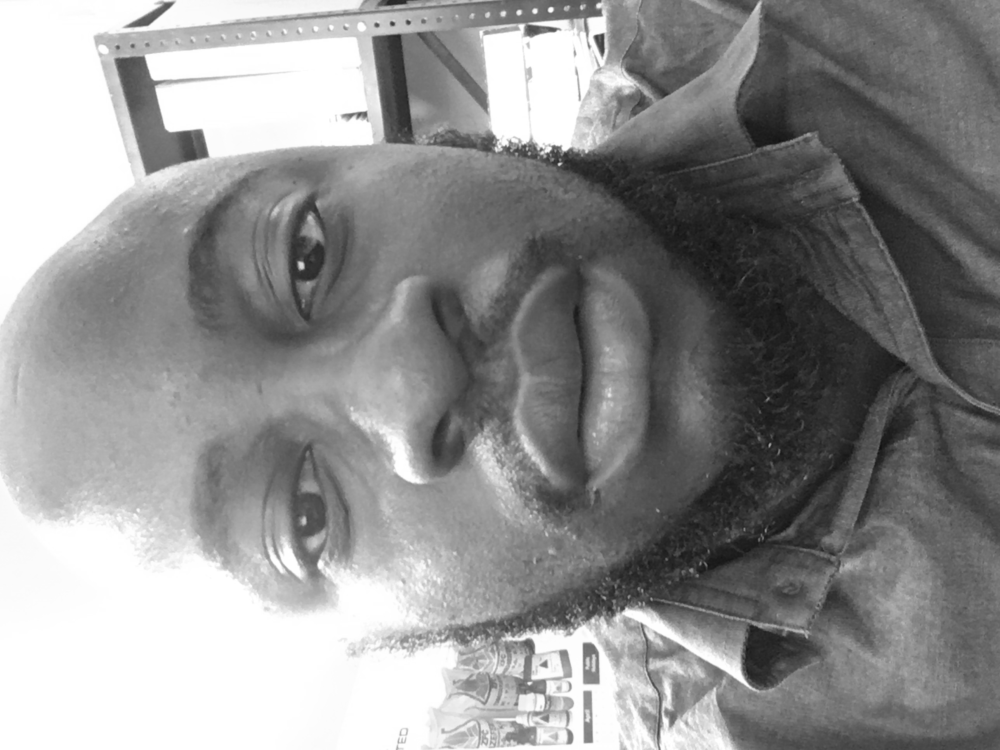

In [6]:
Image2= Chrispen.convert('L')

Image2

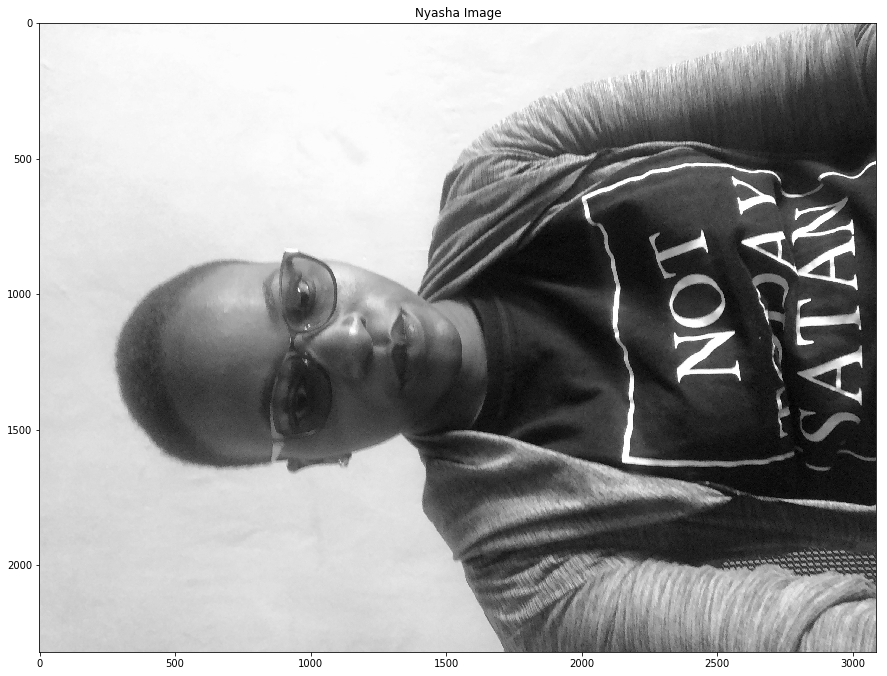

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
plt.title('Nyasha Image')
plt.imshow(Image); plt.show()

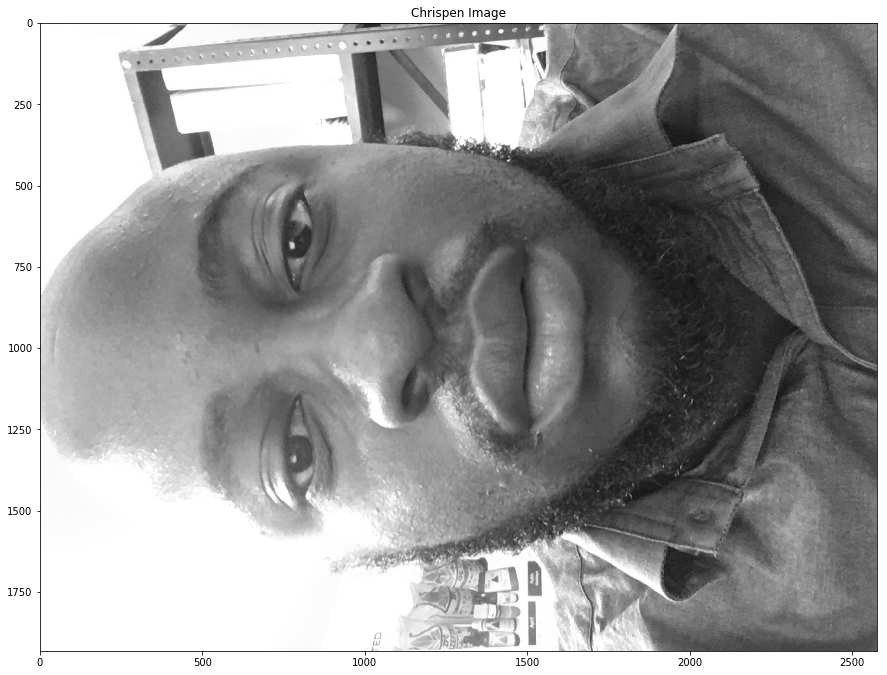

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
plt.title('Chrispen Image')
plt.imshow(Image2); plt.show()

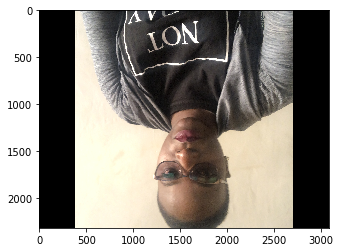

In [11]:
# Rotating the image by 90 degrees

from PIL import Image
from matplotlib import pyplot
pyplot.imshow(Nyasha.rotate(90))
pyplot.show()

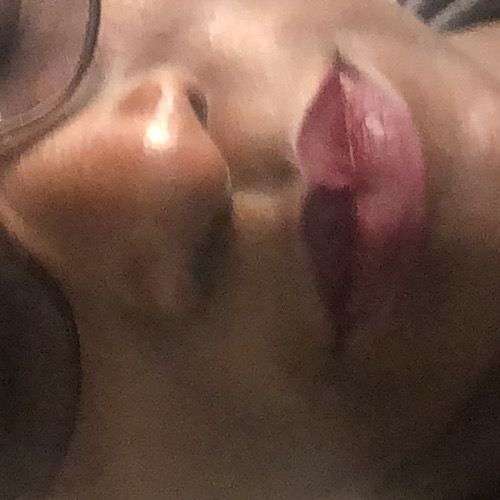

In [20]:
# cropping an image 

from PIL import Image
cropped = Nyasha.crop((1000, 1000, 1500, 1500))
cropped

# Choice of the Convolution Neural Network 

Input Layer - Input layer in CNN should contain image data.A single raw image is given as an input.An RGB image is represented by three dimensional matrix (64x64x3), where 3 represents the colours Red, Green and Blue. 

Convolutional layer - The primary purpose of a convolution is to extract features from the input image. Convolution preserves the spartial relationship between pixels by learning image features using small squares of input data.
Firstly, a part of image is connected to Convo layer to perform convolution operation  and calculating the dot product between receptive field(it is a local region of the input image that has the same size as that of filter) and the filter. This produces a single integer of the output volume. Then we slide the filter over the next receptive field of the same input image by a Stride and do the same operation again. We will repeat the same process again and again until we go through the whole image. The output will be the input for the next layer.Convo layer also contains ReLU activation to make all negative values to zero.


Pooling layer - combines the outputs of neuron clusters at one layer into a single neuron in the next layer.It reduces the dimensionality of each feature map but retains the most important information. This is done to reduce memory and increase in execution speed and to reduce overfitting.Pooling layers make feature detection independent of noise and small changes like image rotation or tilting.Max Pooling takes the maximum value within the convolution filter.There is no parameter in the pooling layer but it has two hyperparameters — Filter(F) and Stride(S).


                   
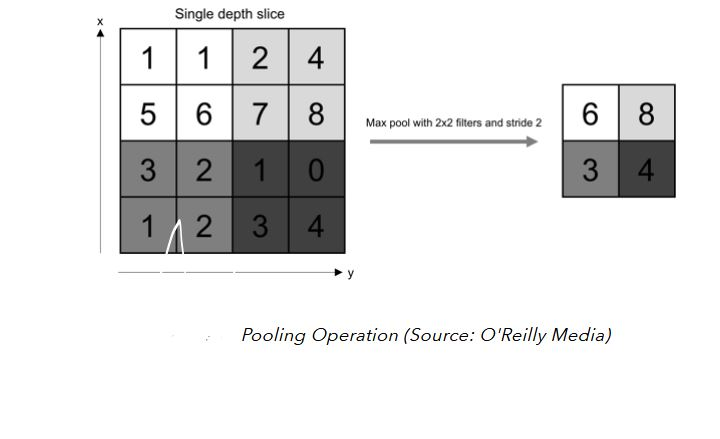

After pooling comes flattening where the matrix is converted into a linear array to input it into the nodes of our neural network.Dropout layers force the model to learn multiple independent representations of the same data by randomly disabling neurons in the learning phase.

After multiple layers of convolutional and pooling layers, a fully connected layer completes the network. The fully connected layer is a traditional multilayer perceptron responsible for the classification task.The layer helps map the representation between the input and the output.Fully connected layer involves weights, biases, and neurons. It connects neurons in one layer to neurons in another layer. It is used to classify images between different category by training.



# Explanation of parameters 

In a CNN, each layer has two kinds of parameters : weights and biases. The total number of parameters is just the sum of all weights and biases.

Input Layer: All the input layer does is read the image. So, there are no parameters to learn in here.

Convolutional Layer: Let us consider a convolutional layer which takes “l” feature maps as the input and has “k” feature maps as output. The filter size is “nXm”.As an output from first conv layer, we learn  filters whose total weights is “nXmXkXl”.  So, the total number of parameters for the convolution layer  are “(nXmXl+1)Xk”.

Pooling Layer: There are no parameters you could learn in the pooling layer. This layer is just used to reduce the image dimension size.

Fully-connected Layer: In this layer, all inputs units have a separable weight to each output unit. For “n” inputs and “m” outputs, the number of weights is “nXm”. Additionally, this layer has the bias for each output node, so “(n+1)*m” parameters.

Output Layer: This layer is the fully connected layer, so “(n+1)m” parameters, when “n” is the number of inputs and “m” is the number of outputs.



# Architecture diagram of the CNN

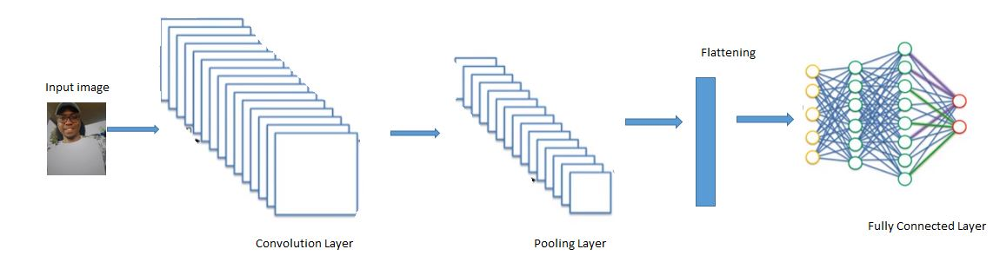


In [8]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

C:\Users\User 1\Anaconda3\envs\mla\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [11]:
#Initializing the CNN
model = tf.keras.models.Sequential()

In [12]:
#Adding the first convolutional layer
model.add(tf.keras.layers.Conv2D(32, (3, 3), input_shape = (64, 64,3), activation = 'relu'))

In [13]:
#Pooling layer 1
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2),strides=(1, 1), padding='valid'))

In [14]:
# Adding the second convolutional layer
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu'))

In [15]:
#Pooling layer 2
model.add(tf.keras.layers.MaxPooling2D(pool_size = (2, 2),strides=(1, 1), padding='valid'))

In [16]:
#Flattening
model.add(tf.keras.layers.Flatten())

In [17]:

model.add(tf.keras.layers.Dense(units = 128, activation = 'relu')) 
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(units = 128, activation = 'relu'))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(units = 128, activation = 'relu')) 
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

In [18]:

model.compile(optimizer = tf.keras.optimizers.SGD(lr=0.0001, momentum=0.9), loss = 'binary_crossentropy', metrics = ['accuracy'])

In [19]:


train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255,
                                                                shear_range = 0.2,
                                                                zoom_range = 0.2,
                                                                horizontal_flip = True)

In [20]:
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)

In [21]:
training_set = train_datagen.flow_from_directory('Images\\Training_Set',
                                                 target_size = (64, 64),
                                                 batch_size = 3,
                                                 class_mode = 'binary')

Found 800 images belonging to 2 classes.


In [22]:
test_set = test_datagen.flow_from_directory('Images\\Test_Set',
                                            target_size = (64, 64),
                                            batch_size = 3,
                                            class_mode = 'binary')

Found 200 images belonging to 2 classes.


In [23]:

tensorboard = tf.keras.callbacks.TensorBoard(log_dir='tb_logs', histogram_freq=1,
                          write_graph=True, write_images=True)

In [24]:

checkpoint = tf.keras.callbacks.ModelCheckpoint("MLGroupAssign_model.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
early = tf.keras.callbacks.EarlyStopping(monitor='val_acc', min_delta=0, patience=10, verbose=1, mode='auto')

In [25]:
tensorboard = tf.keras.callbacks.TensorBoard(log_dir='tb_logs', histogram_freq=1, write_graph=True, write_images=True)

In [ ]:

model.fit_generator(training_set,
                    steps_per_epoch = 1000,
                    epochs = 20,
                    verbose=1,
                    validation_data = test_set,
                    callbacks = [checkpoint, early, tensorboard],
                    validation_steps = 500)

Epoch 1/20
 999/1000 [============================>.] - ETA: 0s - loss: 0.1937 - acc: 0.9393
Epoch 00001: val_acc improved from -inf to 0.93503, saving model to MLGroupAssign_model.h5
1000/1000 [==============================] - 1717s 2s/step - loss: 0.1936 - acc: 0.9393 - val_loss: 0.2004 - val_acc: 0.9350
Epoch 2/20
 999/1000 [============================>.] - ETA: 0s - loss: 0.0177 - acc: 0.9953
Epoch 00002: val_acc improved from 0.93503 to 0.99464, saving model to MLGroupAssign_model.h5
1000/1000 [==============================] - 1725s 2s/step - loss: 0.0177 - acc: 0.9953 - val_loss: 0.0157 - val_acc: 0.9946
Epoch 3/20
 999/1000 [============================>.] - ETA: 0s - loss: 0.0062 - acc: 0.9987
Epoch 00003: val_acc did not improve from 0.99464
1000/1000 [==============================] - 1727s 2s/step - loss: 0.0062 - acc: 0.9987 - val_loss: 0.1271 - val_acc: 0.9705
Epoch 4/20
 999/1000 [============================>.] - ETA: 0s - loss: 0.0069 - acc: 0.9987
Epoch 00004: val_a

In [ ]:
#Saving model

model.save_weights("MLGroupAssign_model.h5")
print("Saved model to disk")

# Early stopping

The challenge is to train the network long enough that it is capable of learning the mapping from inputs to outputs, but not training the model so long that it overfits the training data.Too little training will mean that the model will underfit the train and the test sets. Too much training will mean that the model will overfit the training dataset and have poor performance on the test set.A compromise is to train on the training dataset but to stop training at the point when performance on a validation dataset starts to degrade. This simple, effective, and widely used approach to training neural networks is called early stopping.The idea behind early stopping is relatively simple:

*   Split data into training and test sets
*   At the end of each epoch (or, every N epochs):
      *  evaluate the network performance on the test set
      * if the network outperforms the previous best model: save a copy of the network at the current epoch
* Take as our final model the model that has the best test set performance
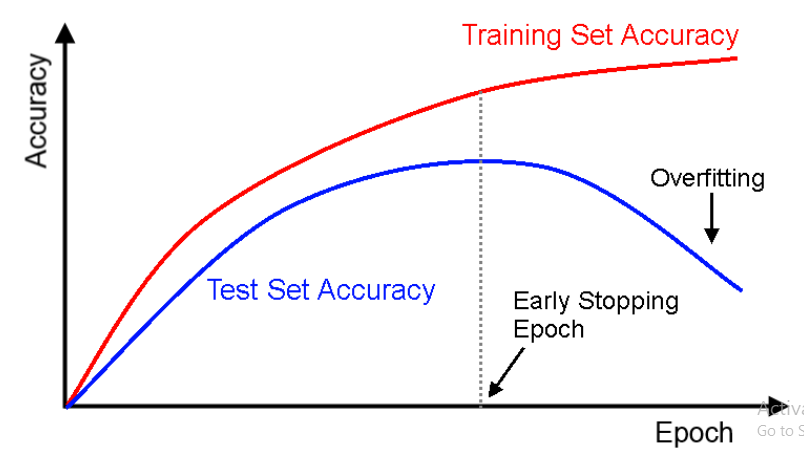

# Hyperparameter Tuning

The hyper parameters are typically the learning rate, the batch size or the number of epochs.An epoch describes the number of times the algorithm sees the entire data set. So, each time the algorithm has seen all samples in the dataset, an epoch has completed. The number of epochs should be increased until there is a small gap between the test error and the training error.

The learning rate is one of the most important hyper-parameters to tune for training deep neural networks.It  is a hyper-parameter that controls how much we are adjusting the weights of our network with respect the loss gradient. It controls how much to update the weight in the optimization algorithm. This parameter also tells the optimizer how far to move the weights in the direction opposite of the gradient for a mini-batch.If the learning rate is low, then training is more reliable, but optimization will take a lot of time because steps towards the minimum of the loss function are tiny.If the learning rate is high, then training may not converge or even diverge. Weight changes can be so big that the optimizer overshoots the minimum and makes the loss worse.

Batch size -the number of training examples in one forward/backward pass. The higher the batch size, the more memory space you'll need.Batch size refers to the number of training examples utilised in one iteration. The batch size can be one of three options:

1. batch mode: where the batch size is equal to the total dataset thus making the iteration and epoch values equivalent

2. mini-batch mode: where the batch size is greater than one but less than the total dataset size. Usually, a number that can be divided into the total dataset size.

3. stochastic mode: where the batch size is equal to one. Therefore the gradient and the neural network parameters are updated after each sample.




In [ ]:

# Loading a prediction test image

In [26]:
test_image = tf.keras.preprocessing.image.load_img('Images\\Single_Prediction\\ChrispenorNyashaorPaul.JPG', target_size = (64, 64))
test_image = tf.keras.preprocessing.image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result =model.predict(test_image)

if result[0][0] == 1:
    prediction = 'This is Nyasha'
else:
    prediction = 'This is Chrispen' 

In [27]:
print(prediction)

This is Nyasha


In [28]:
test_image = tf.keras.preprocessing.image.load_img('Images\\Single_Prediction\\NyashaorChrispenorPaul.JPG', target_size = (64, 64))
test_image = tf.keras.preprocessing.image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result =model.predict(test_image)

if result[0][0] == 1:
    prediction = 'This is Nyasha'
else:
    prediction = 'This is Chrispen' 

In [29]:
print(prediction)

This is Chrispen


# Conclusion

The CNN model has managed to correctly classify the supplied faces from the group members .There are various challenges associated with image classification which include viewpoint variation, scale variation, intra-class variation, image deformation, image occlusion, illumination conditions and background clutter .

# REFERENCES


https://www.kdnuggets.com

ttps://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2

https://www.researchgate.net/post/How_do_we_choose_the_filters_for_the_convolutional_layer_of_a_Convolution_Neural_Network_CNN
